<a href="https://colab.research.google.com/github/vivekgautamgv/EXCEED/blob/main/Copy_of_exceed_object_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 913.6/913.6 kB 26.1 MB/s eta 0:00:00


In [2]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="eiESuKS5Yz7zKQnhnycT")
project = rf.workspace("viveks-dan").project("dataset-for-detecting-obstacles-on-railways-dogeu")
version = project.version(2)
dataset = version.download("yolov11")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.5/81.5 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 14.6 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.11.0.86
    Uninstalling opencv-python-headless-4.11.0.86:
      Successfully uninstalled opencv-python-headless-4.11.0.86
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Dataset-for-Detecting-Obstacles-on-Railways-2 in yolov11:: 100%|██████████| 3372/3372 [00:05<00:00, 665.84it/s] 


In [3]:
!yolo detect train data=/content/Dataset-for-Detecting-Obstacles-on-Railways-2/data.yaml model=yolo11n.pt epochs = 15 imgsz = 640

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
100% 5.35M/5.35M [00:00<00:00, 324MB/s]
Ultralytics 8.3.68 🚀 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/Dataset-for-Detecting-Obstacles-on-Railways-2/data.yaml, epochs=15, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=Tru

In [ ]:
import cv2
import numpy as np
from ultralytics import YOLO
import os

# Known parameters
KNOWN_WIDTH = {
    'Animal': 100,  # Average width in cm
    'Car': 180,
    'Person': 45,
    'Rock': 50,
    'Trash': 40
}

def calibrate_focal_length(known_distance, known_width, width_in_pixels):
    return (width_in_pixels * known_distance) / known_width

def calculate_distance(focal_length, real_width, width_in_pixels):
    return (real_width * focal_length) / width_in_pixels

# Load your trained model
model = YOLO('runs/detect/train/weights/best.pt')

# Calibration image path
calibration_image_path = '/content/Dataset-for-Detecting-Obstacles-on-Railways-2/train/images/IMG_20231024_105131.jpg'   # Replace with your calibration image path
CALIBRATION_DISTANCE = 500  # cm
calibration_class = 'Person'

# Calibrate focal length
calibration_image = cv2.imread(calibration_image_path)
focal_length = None

results = model(calibration_image)
for r in results:
    boxes = r.boxes
    for box in boxes:
        cls = int(box.cls[0])
        class_name = model.names[cls]
        if class_name == calibration_class:
            x1, y1, x2, y2 = box.xyxy[0]
            width_in_pixels = x2 - x1
            focal_length = calibrate_focal_length(
                CALIBRATION_DISTANCE,
                KNOWN_WIDTH[calibration_class],
                width_in_pixels
            )
            break

# Directory containing test images
image_directory = 'path_to_test_images/'  # Replace with your image directory path
output_directory = 'path_to_output/'      # Replace with your output directory path

# Create output directory if it doesn't exist
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Process each image in the directory
for image_file in os.listdir(image_directory):
    if image_file.lower().endswith(('.png', '.jpg', '.jpeg')):
        # Read image
        image_path = os.path.join(image_directory, image_file)
        frame = cv2.imread(image_path)

        results = model(frame)

        for r in results:
            boxes = r.boxes
            for box in boxes:
                # Get detection info
                x1, y1, x2, y2 = box.xyxy[0]
                cls = int(box.cls[0])
                class_name = model.names[cls]
                conf = box.conf[0]

                # Calculate width in pixels and distance
                width_in_pixels = x2 - x1
                if class_name in KNOWN_WIDTH:
                    distance = calculate_distance(
                        focal_length,
                        KNOWN_WIDTH[class_name],
                        width_in_pixels
                    )

                    # Draw bounding box and label with distance
                    cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
                    label = f"{class_name}: {distance:.2f}cm"
                    cv2.putText(frame, label, (int(x1), int(y1-10)),
                               cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

                    # Warning for close objects
                    if distance < 1000:  # 10 meters
                        warning = "WARNING: Object too close!"
                        cv2.putText(frame, warning, (10, 30),
                                  cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)

        # Save the processed image
        output_path = os.path.join(output_directory, f'processed_{image_file}')
        cv2.imwrite(output_path, frame)

        # Display the image (optional)
        cv2.imshow('Railway Obstacle Detection', frame)
#         cv2.waitKey(0)  # Wait for key press

# cv2.destroyAllWindows()


WARNING ⚠️ 'source' is missing. Using 'source=/usr/local/lib/python3.11/dist-packages/ultralytics/assets'.

image 1/2 /usr/local/lib/python3.11/dist-packages/ultralytics/assets/bus.jpg: 640x480 3 Persons, 12.9ms
image 2/2 /usr/local/lib/python3.11/dist-packages/ultralytics/assets/zidane.jpg: 384x640 (no detections), 11.3ms
Speed: 2.6ms preprocess, 12.1ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


FileNotFoundError: [Errno 2] No such file or directory: 'path_to_test_images/'

WARNING ⚠️ 'source' is missing. Using 'source=/usr/local/lib/python3.11/dist-packages/ultralytics/assets'.

image 1/2 /usr/local/lib/python3.11/dist-packages/ultralytics/assets/bus.jpg: 640x480 4 Persons, 44.2ms
image 2/2 /usr/local/lib/python3.11/dist-packages/ultralytics/assets/zidane.jpg: 384x640 1 Animal, 1 Person, 1 Trash, 51.5ms
Speed: 3.0ms preprocess, 47.9ms inference, 257.0ms postprocess per image at shape (1, 3, 384, 640)

0: 640x480 6 Persons, 2 Trees, 10.1ms
Speed: 4.4ms preprocess, 10.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)


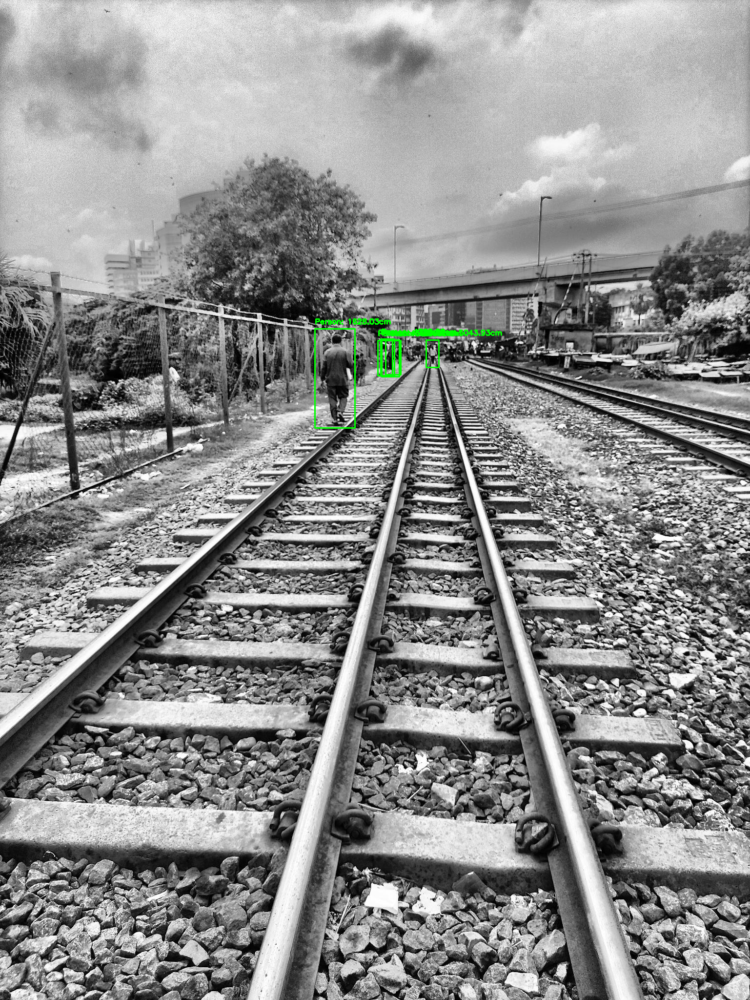

error: OpenCV(4.10.0) /io/opencv/modules/highgui/src/window.cpp:1367: error: (-2:Unspecified error) The function is not implemented. Rebuild the library with Windows, GTK+ 2.x or Cocoa support. If you are on Ubuntu or Debian, install libgtk2.0-dev and pkg-config, then re-run cmake or configure script in function 'cvWaitKey'


In [4]:
import cv2
import numpy as np
from ultralytics import YOLO
import os

!pip install ultralytics
!pip install roboflow

from roboflow import Roboflow
from google.colab.patches import cv2_imshow # Import cv2_imshow
import cv2
import numpy as np
from ultralytics import YOLO
import os

# Known parameters
KNOWN_WIDTH = {
    'Animal': 100,  # Average width in cm
    'Car': 180,
    'Person': 45,
    'Rock': 50,
    'Trash': 40
}

def calibrate_focal_length(known_distance, known_width, width_in_pixels):
    return (width_in_pixels * known_distance) / known_width

def calculate_distance(focal_length, real_width, width_in_pixels):
    return (real_width * focal_length) / width_in_pixels

# Load your trained model
model = YOLO('runs/detect/train/weights/best.pt')

# Calibration image path
calibration_image_path = '/content/Dataset-for-Detecting-Obstacles-on-Railways-2/train/images/IMG_20231024_105131.jpg'   # Replace with your calibration image path
CALIBRATION_DISTANCE = 500  # cm
calibration_class = 'Person'

# Calibrate focal length
calibration_image = cv2.imread(calibration_image_path)
focal_length = None

results = model(calibration_image)
for r in results:
    boxes = r.boxes
    for box in boxes:
        cls = int(box.cls[0])
        class_name = model.names[cls]
        if class_name == calibration_class:
            x1, y1, x2, y2 = box.xyxy[0]
            width_in_pixels = x2 - x1
            focal_length = calibrate_focal_length(
                CALIBRATION_DISTANCE,
                KNOWN_WIDTH[calibration_class],
                width_in_pixels
            )
            break

# Directory containing test images
# Replace 'path_to_test_images/' with the actual path to your test images
image_directory = '/content/Dataset-for-Detecting-Obstacles-on-Railways-2/valid/images/'
output_directory = 'path_to_output/'      # Replace with your output directory path

# Create output directory if it doesn't exist
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Process each image in the directory
for image_file in os.listdir(image_directory):
    if image_file.lower().endswith(('.png', '.jpg', '.jpeg')):
        # Read image
        image_path = os.path.join(image_directory, image_file)
        frame = cv2.imread(image_path)

        results = model(frame)

        for r in results:
            boxes = r.boxes
            for box in boxes:
                # Get detection info
                x1, y1, x2, y2 = box.xyxy[0]
                cls = int(box.cls[0])
                class_name = model.names[cls]
                conf = box.conf[0]

                # Calculate width in pixels and distance
                width_in_pixels = x2 - x1
                if class_name in KNOWN_WIDTH:
                    distance = calculate_distance(
                        focal_length,
                        KNOWN_WIDTH[class_name],
                        width_in_pixels
                    )

                    # Draw bounding box and label with distance
                    cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
                    label = f"{class_name}: {distance:.2f}cm"
                    cv2.putText(frame, label, (int(x1), int(y1-10)),
                               cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

                    # Warning for close objects
                    if distance < 1000:  # 10 meters
                        warning = "WARNING: Object too close!"
                        cv2.putText(frame, warning, (10, 30),
                                  cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)

        # Save the processed image
        output_path = os.path.join(output_directory, f'processed_{image_file}')
        cv2.imwrite(output_path, frame)

        # Display the image (optional)
        cv2_imshow(frame)
        cv2.waitKey(0)  # Wait for key press

cv2.destroyAllWindows()

WARNING ⚠️ 'source' is missing. Using 'source=/usr/local/lib/python3.11/dist-packages/ultralytics/assets'.

image 1/2 /usr/local/lib/python3.11/dist-packages/ultralytics/assets/bus.jpg: 640x480 4 Persons, 12.9ms
image 2/2 /usr/local/lib/python3.11/dist-packages/ultralytics/assets/zidane.jpg: 384x640 1 Animal, 1 Person, 1 Trash, 15.1ms
Speed: 3.2ms preprocess, 14.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 640x480 6 Persons, 2 Trees, 11.2ms
Speed: 4.3ms preprocess, 11.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


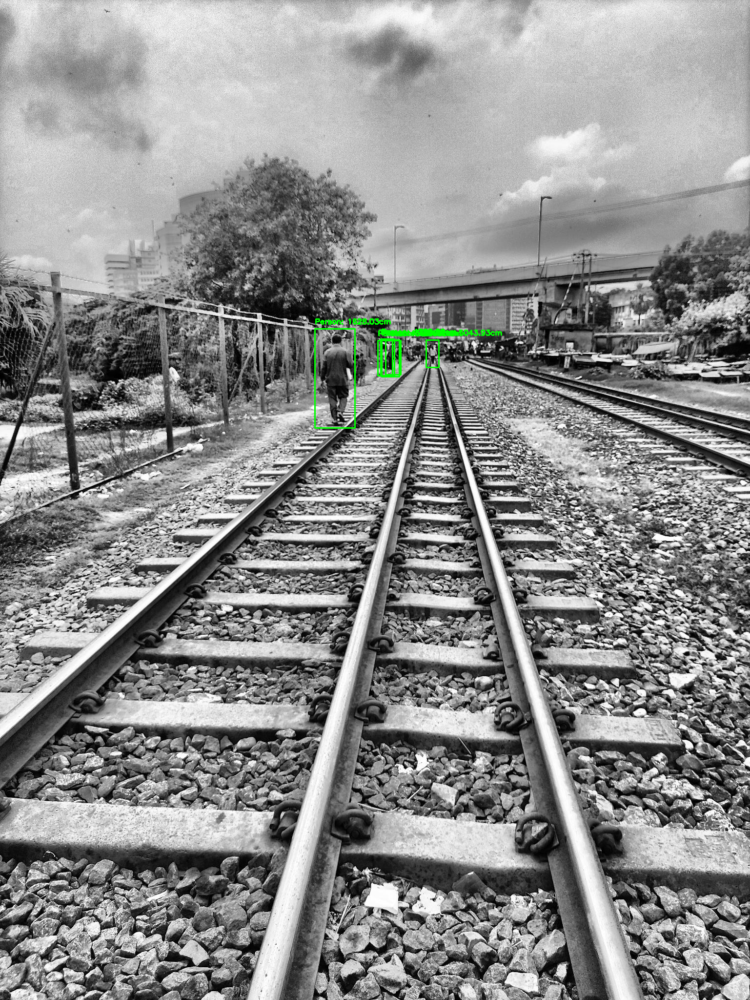

In [ ]:
!pip install ultralytics
!pip install roboflow

import cv2
import numpy as np
from ultralytics import YOLO
import os
from google.colab.patches import cv2_imshow # Import for displaying in Colab


# Known parameters
KNOWN_WIDTH = {
    'Animal': 100,  # Average width in cm
    'Car': 180,
    'Person': 45,
    'Rock': 50,
    'Trash': 40
}

def calibrate_focal_length(known_distance, known_width, width_in_pixels):
    return (width_in_pixels * known_distance) / known_width

def calculate_distance(focal_length, real_width, width_in_pixels):
    return (real_width * focal_length) / width_in_pixels

# Load your trained model
model = YOLO('runs/detect/train/weights/best.pt')

# Calibration image path
calibration_image_path = '/content/Dataset-for-Detecting-Obstacles-on-Railways-2/train/images/IMG_20231024_105131.jpg'   # Replace with your calibration image path
CALIBRATION_DISTANCE = 500  # cm
calibration_class = 'Person'

# Calibrate focal length
calibration_image = cv2.imread(calibration_image_path)
focal_length = None

results = model(calibration_image)
for r in results:
    boxes = r.boxes
    for box in boxes:
        cls = int(box.cls[0])
        class_name = model.names[cls]
        if class_name == calibration_class:
            x1, y1, x2, y2 = box.xyxy[0]
            width_in_pixels = x2 - x1
            focal_length = calibrate_focal_length(
                CALIBRATION_DISTANCE,
                KNOWN_WIDTH[calibration_class],
                width_in_pixels
            )
            break

# Directory containing test images
# Replace 'path_to_test_images/' with the actual path to your test images
image_directory = '/content/Dataset-for-Detecting-Obstacles-on-Railways-2/valid/images/'
output_directory = 'path_to_output/'      # Replace with your output directory path

# Create output directory if it doesn't exist
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Process only the first 25 images
image_files = [f for f in os.listdir(image_directory) if f.lower().endswith(('.png', '.jpg', '.jpeg'))][:25]

for image_file in image_files:
    # Read image
    image_path = os.path.join(image_directory, image_file)
    frame = cv2.imread(image_path)

    results = model(frame)

    for r in results:
        boxes = r.boxes
        for box in boxes:
            # Get detection info
            x1, y1, x2, y2 = box.xyxy[0]
            cls = int(box.cls[0])
            class_name = model.names[cls]
            conf = box.conf[0]

            # Calculate width in pixels and distance
            width_in_pixels = x2 - x1
            if class_name in KNOWN_WIDTH:
                distance = calculate_distance(
                    focal_length,
                    KNOWN_WIDTH[class_name],
                    width_in_pixels
                )

                # Draw bounding box and label with distance
                cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
                label = f"{class_name}: {distance:.2f}cm"
                cv2.putText(frame, label, (int(x1), int(y1-10)),
                           cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

                # Warning for close objects
                if distance < 1000:  # 10 meters
                    warning = "WARNING: Object too close!"
                    cv2.putText(frame, warning, (10, 30),
                              cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)

    # Save the processed image
    output_path = os.path.join(output_directory, f'processed_{image_file}')
    cv2.imwrite(output_path, frame)

    # Display the image using cv2_imshow for Colab
    cv2_imshow(frame)